In [ ]:
import matplotlib.pyplot as plt
import numpy as np

**Object detection** = locate objects from images.

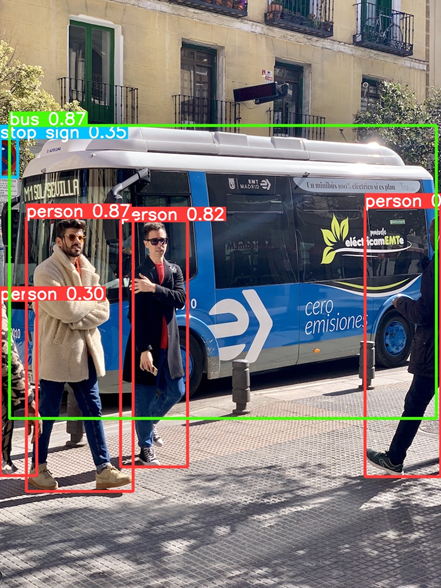

YOLO (You Only Look Once) is one object detection-algorithm.

[YOLOv1](https://pjreddie.com/darknet/yolo/) appeared in 2015 and  [YOLO11](https://github.com/ultralytics/ultralytics)  in 2024.

Some history of YOLO can be found for example from [here](https://www.theseus.fi/handle/10024/452552)


YOLO is written using [PyTorch](https://pytorch.org/)-library, and the structure of YOLOv8 is described  [here](https://blog.roboflow.com/whats-new-in-yolov8/).

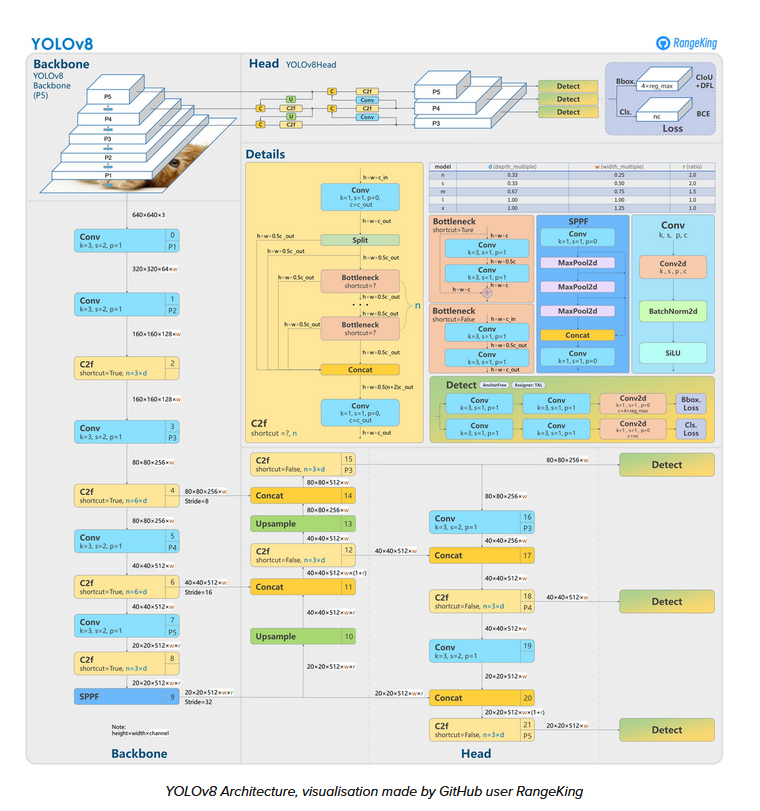

## **Pretrained weights**



YOLO11 contains 5 pretrained  [models](https://docs.ultralytics.com/models/yolov8/#key-features):

yolo11n.pt (nano)

 yolo11s.pt (small)

  yolo11m.pt (medium)
  
  yolo11l.pt (large)
  
  yolo11x.pt (extra large)

They are trained using [COCO](https://cocodataset.org/#home)-dataset to locate objects from 80 different classes:

person, bicycle, car, motorcycle, airplane, bus, train, truck, boat, traffic light,
  fire hydrant, stop sign, parking meter, bench, bird, cat, dog, horse, sheep, cow,
  elephant, bear, zebra, giraffe, backpack, umbrella, handbag, tie, suitcase, frisbee,
  skis, snowboard, sports ball, kite, baseball bat, baseball glove, skateboard, surfboard,
  tennis racket, bottle, wine glass, cup, fork, knife, spoon, bowl, banana, apple,
  sandwich, orange, broccoli, carrot, hot dog, pizza, donut, cake, chair, couch,
  potted plant, bed, dining table, toilet, tv, laptop, mouse, remote, keyboard, cell phone,
  microwave, oven, toaster, sink, refrigerator, book, clock, vase, scissors, teddy bear,
  hair drier, toothbrush

In [ ]:
!pip install ultralytics

In [ ]:
from ultralytics import YOLO
model=YOLO('yolo11n.pt')

In [ ]:
#predictions for example picture
predictions=model.predict('https://ultralytics.com/images/bus.jpg',save=True)
#save = True -> draws the boxes to image bus.jpg


Found https://ultralytics.com/images/bus.jpg locally at bus.jpg
image 1/1 /content/bus.jpg: 640x480 4 persons, 1 bus, 243.8ms
Speed: 12.0ms preprocess, 243.8ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 480)
Results saved to runs/detect/predict4


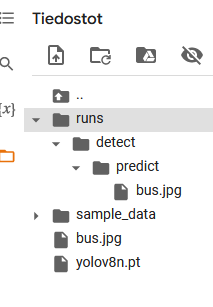

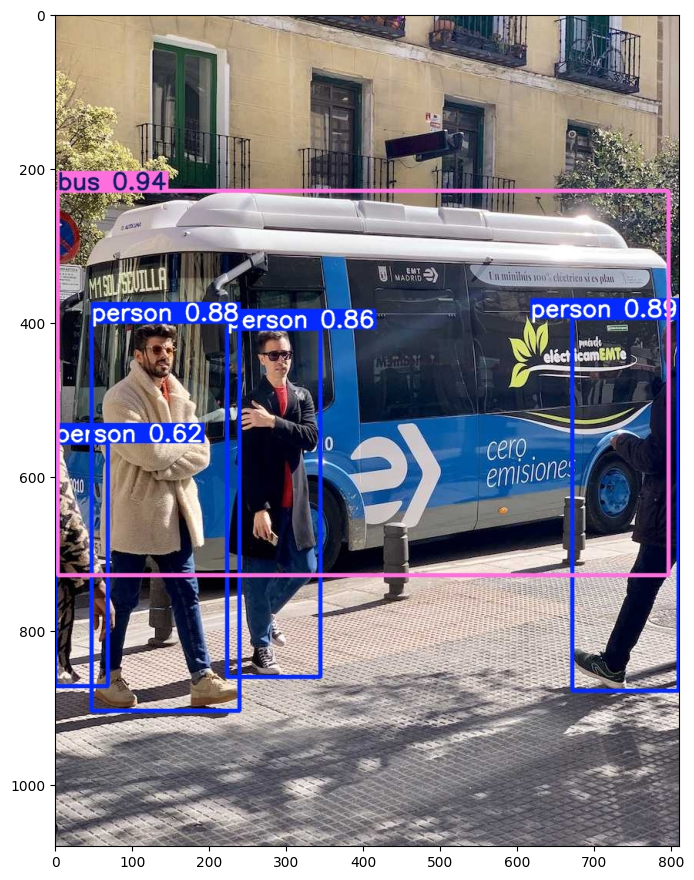

In [ ]:
kuva=plt.imread('/content/runs/detect/predict/bus.jpg')
m,n,_=kuva.shape
plt.figure(figsize=(n/100,m/100))
plt.imshow(kuva) #numbers are predicted probabilities (confidence)
#that a box contains an object of the stated coco class
plt.show()

In [ ]:
#predicted boxes
boxes=predictions[0].boxes.data.cpu().numpy() #.cpu(), if GPU is in use
boxes

array([[     3.8327,      229.36,      796.19,      728.41,     0.94015,           5],
       [     671.02,      394.83,      809.81,      878.71,     0.88822,           0],
       [     47.405,      399.57,       239.3,       904.2,     0.87825,           0],
       [     223.06,      408.69,      344.47,      860.44,     0.85577,           0],
       [   0.021726,      556.07,      68.885,      872.36,     0.62192,           0]], dtype=float32)

each row predicts one box:

[xmin, ymin, xmax, ymax, confidence, class]


xmin, ymin, xmax, ymax are the coordinates of the corners of the box.

confidence is the predicted probability, that  the box contains an object from COCO-class  (5 = bus, 0 = person)

(YOLO calculates probabilities for each 80 classes and returns the largest)

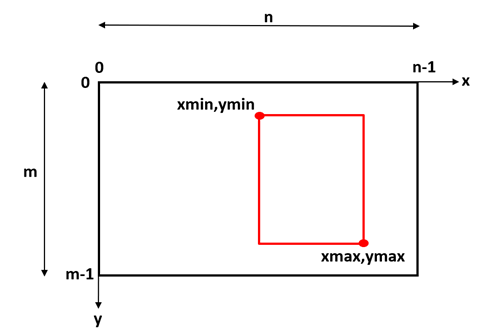

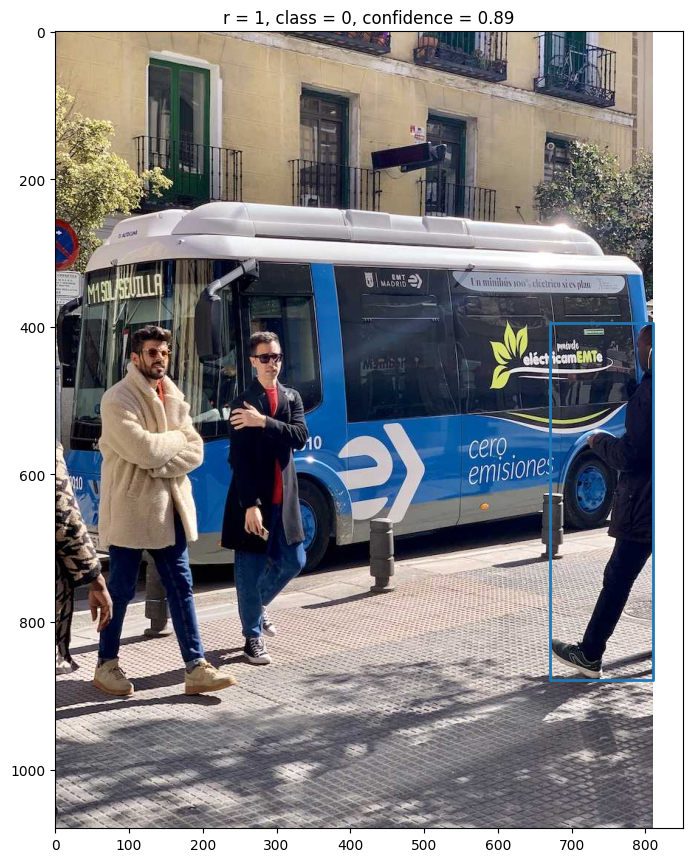

In [ ]:
kuva=plt.imread('bus.jpg')
m,n,_=kuva.shape

plt.figure(figsize=(n/100,m/100))
plt.imshow(kuva)
M=boxes.shape[0]
r=np.random.randint(M)
xmin,ymin,xmax,ymax,conf,cls=boxes[r,:]
plt.plot([xmin,xmin,xmax,xmax,xmin],[ymin,ymax,ymax,ymin,ymin],lw=2)
plt.title('r = '+str(r)+', class = '+str(int(cls))+', confidence = {:.2f}'.format(conf))
plt.show()

In [ ]:
#predictions for vrp.jpg (load to Colabiin)
predictions=model.predict('/content/vrp.jpg',conf=0.8,save=True)
#conf=0.8 -> only predictions with conf>=0.8 are shown
#save = True -> boxes to vrp.jpg


image 1/1 /content/vrp.jpg: 384x640 5 cars, 157.8ms
Speed: 3.7ms preprocess, 157.8ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict4


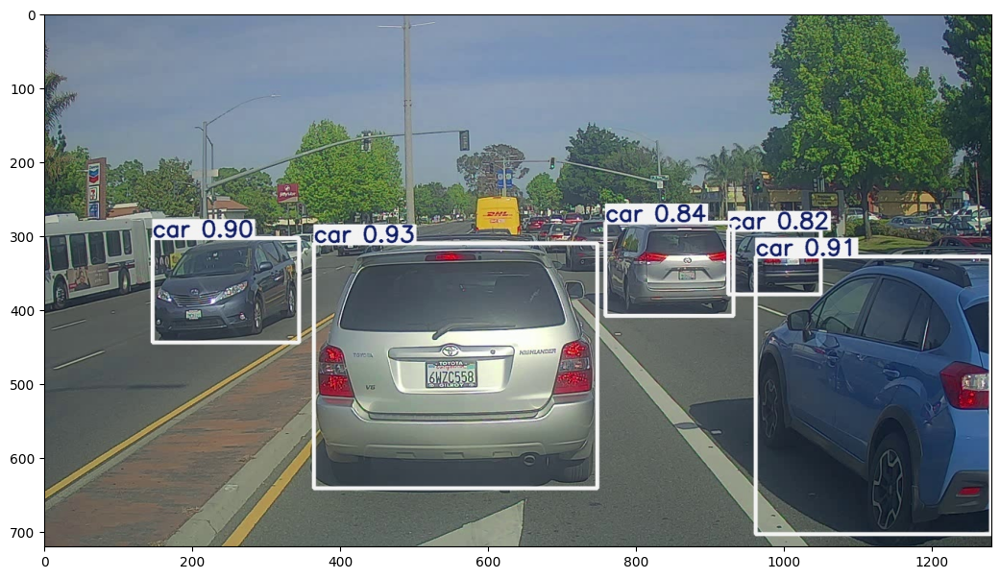

In [ ]:
kuva=plt.imread('/content/runs/detect/predict/vrp.jpg')
m,n,_=kuva.shape
plt.figure(figsize=(n/100,m/100))
plt.imshow(kuva)
plt.show()

In [ ]:
#predicted boxes
boxes=predictions[0].boxes.data.cpu().numpy() #.cpu(), is GPU is in use
boxes

array([[     364.14,      310.27,      747.16,      641.89,     0.92783,           2],
       [     961.06,      328.43,      1279.6,      703.18,     0.90627,           2],
       [      146.9,      303.21,      344.01,      444.33,     0.89953,           2],
       [     758.09,      282.13,      931.66,      408.18,      0.8365,           2],
       [      924.4,      292.39,      1049.8,      379.54,      0.8195,           2]], dtype=float32)

In [ ]:
#predictions for butterfly.jpg (load to Colab)
predictions=model.predict('/content/butterfly.jpg',save=True)
#save = True -> boxes to butterfly.jpg


image 1/1 /content/butterfly.jpg: 448x640 1 bird, 198.4ms
Speed: 7.4ms preprocess, 198.4ms inference, 1.8ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict4


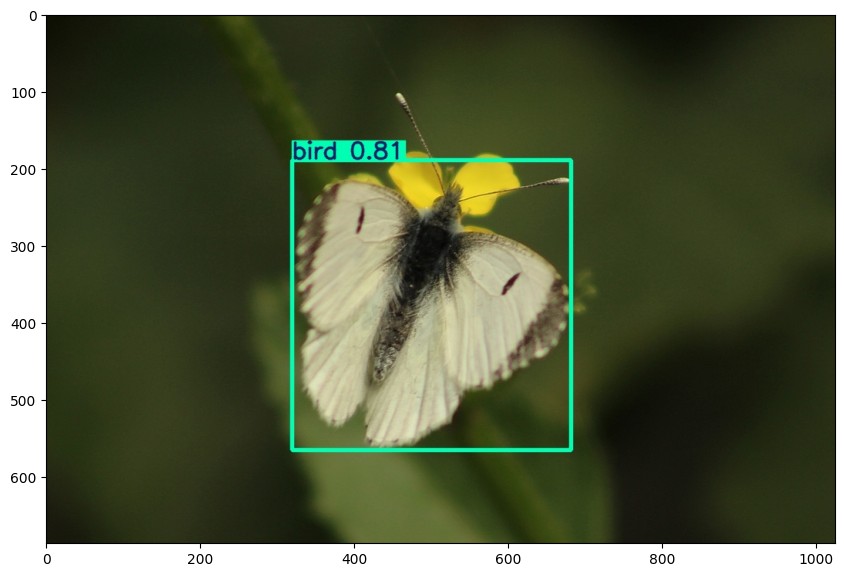

In [ ]:
kuva=plt.imread('/content/runs/detect/predict/butterfly.jpg')
m,n,_=kuva.shape
plt.figure(figsize=(n/100,m/100))
plt.imshow(kuva)
plt.show()

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#use coefficients butterfly.pt
#from ultralytics import YOLO
model2=YOLO('/content/drive/MyDrive/YOLOv8/butterfly.pt')

In [ ]:
#predictions for butterfly.jpg
predictions=model2.predict('/content/butterfly.jpg',save=True)


image 1/1 /content/butterfly.jpg: 448x640 1 Butterfly, 171.1ms
Speed: 4.6ms preprocess, 171.1ms inference, 1.3ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict5


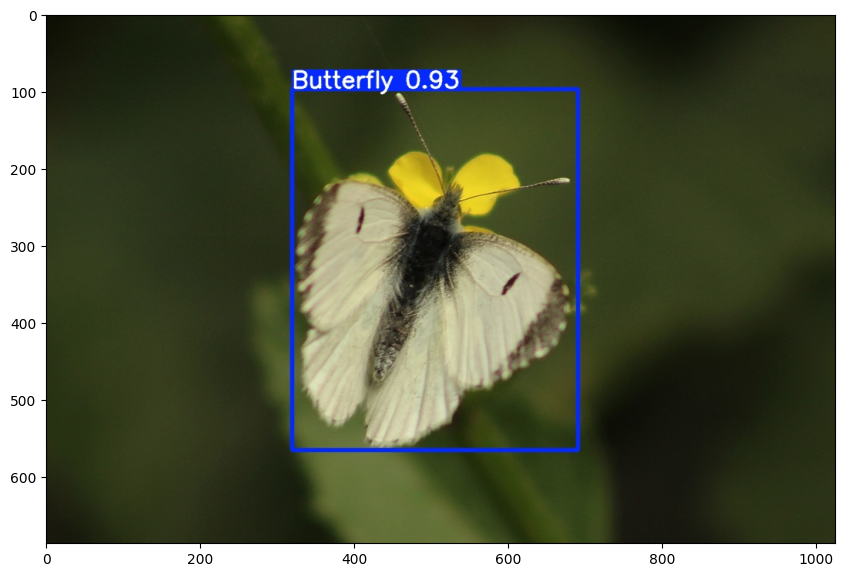

In [ ]:
kuva=plt.imread('/content/runs/detect/predict2/butterfly.jpg')
m,n,_=kuva.shape
plt.figure(figsize=(n/100,m/100))
plt.imshow(kuva)
plt.show()

In [ ]:
#predicted boxes
boxes=predictions[0].boxes.data.cpu().numpy() #.cpu(), if GPU is in use
boxes

array([[     319.08,      97.904,      690.23,       565.6,     0.92578,           0]], dtype=float32)

In [ ]:
#predictions for vrp.jpg
predictions=model2.predict('/content/vrp.jpg',save=True)


image 1/1 /content/vrp.jpg: 384x640 (no detections), 173.1ms
Speed: 2.9ms preprocess, 173.1ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict5


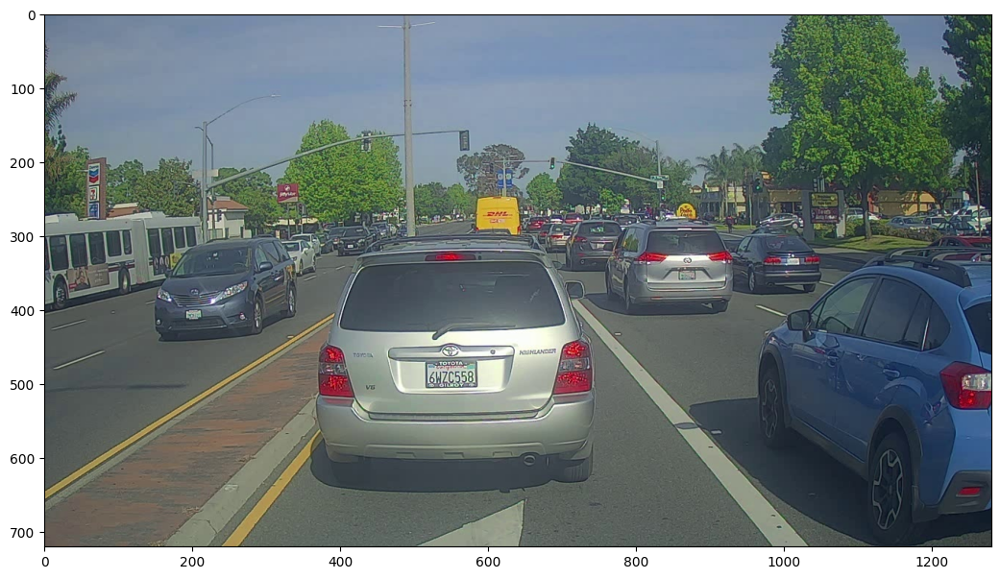

In [ ]:
kuva=plt.imread('/content/runs/detect/predict2/vrp.jpg')
m,n,_=kuva.shape
plt.figure(figsize=(n/100,m/100))
plt.imshow(kuva)
plt.show()

In [ ]:
#use coefficients vrp.pt
#from ultralytics import YOLO
model3=YOLO('/content/drive/MyDrive/YOLOv8/vrp.pt')

In [ ]:
#predictions for vrp.jpg
predictions=model3.predict('/content/vrp.jpg',save=True,conf=0.1)


image 1/1 /content/vrp.jpg: 384x640 6 vrps, 162.7ms
Speed: 3.3ms preprocess, 162.7ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict6


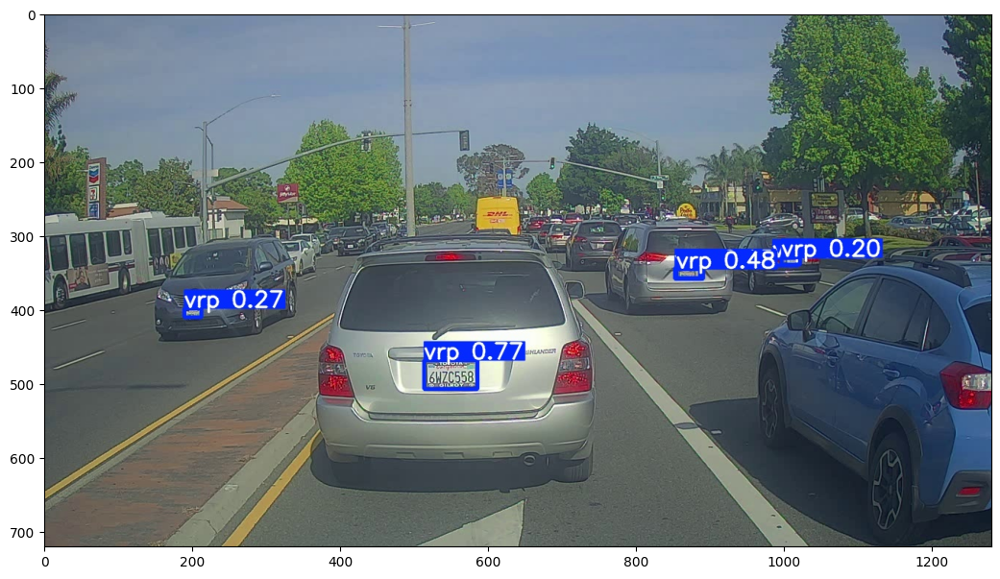

In [ ]:
kuva=plt.imread('/content/runs/detect/predict3/vrp.jpg')
m,n,_=kuva.shape
plt.figure(figsize=(n/100,m/100))
plt.imshow(kuva)
plt.show()

In [ ]:
#predicted boxes
boxes=predictions[0].boxes.data.cpu().numpy() #.cpu(), if GPU is in use
boxes

array([[     513.73,      468.35,      585.92,      507.24,     0.77213,           0],
       [     854.77,      345.26,      886.12,      357.98,     0.47612,           0],
       [     189.26,      398.03,      212.25,      410.78,     0.26842,           0],
       [     996.96,      329.68,      1021.9,      339.56,     0.19641,           0],
       [     852.88,      343.17,      890.53,      358.67,     0.15077,           0],
       [     984.64,      330.15,      1018.3,       340.6,     0.12638,           0]], dtype=float32)

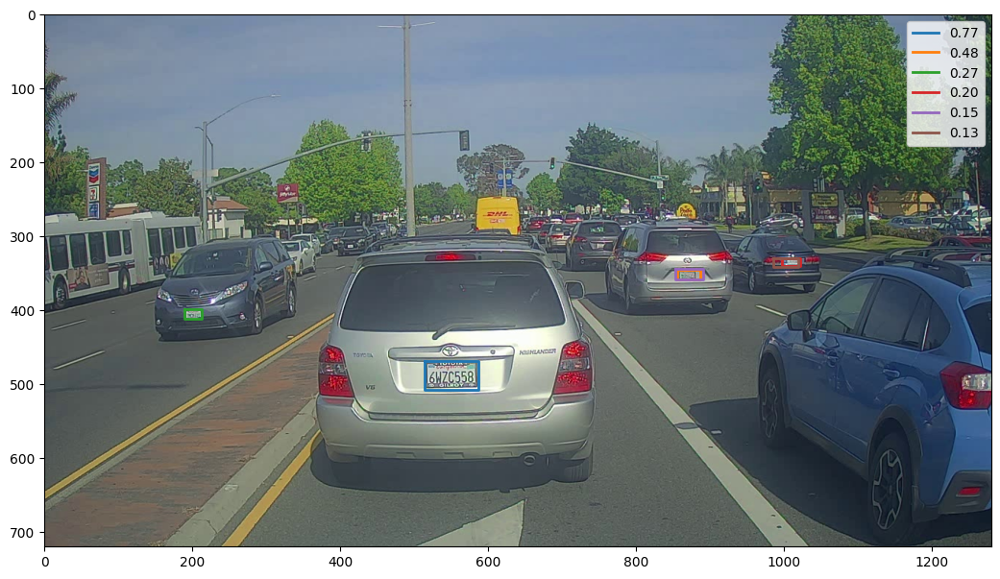

In [ ]:
kuva=plt.imread('vrp.jpg')
m,n,_=kuva.shape

plt.figure(figsize=(n/100,m/100))
plt.imshow(kuva)
M=boxes.shape[0]
for r in range(M):
  xmin,ymin,xmax,ymax,conf,cls=boxes[r,:]
  plt.plot([xmin,xmin,xmax,xmax,xmin],[ymin,ymax,ymax,ymin,ymin],lw=2,label='{:.2f}'.format(boxes[r,4]))
plt.legend()
plt.show()

##**Creating a custom dataset**

Custom dataset (images + ground truth boxes) can be loaded from
 [Open images](https://storage.googleapis.com/openimages/web/index.html)-dataset using [OIDv4 Toolkit](https://github.com/theAIGuysCode/OIDv4_ToolKit)-tool.


Boxes can be drawn by hand using [Image annotation](https://blog.roboflow.com/best-image-annotation-tools/)-tools.








Load a custom dataset from Open images-dataset using OIDv4 ToolKit.

In [ ]:
!git clone https://github.com/theAIGuysCode/OIDv4_ToolKit.git

Cloning into 'OIDv4_ToolKit'...
remote: Enumerating objects: 444, done.
remote: Total 444 (delta 0), reused 0 (delta 0), pack-reused 444 (from 1)
Receiving objects: 100% (444/444), 34.09 MiB | 31.68 MiB/s, done.
Resolving deltas: 100% (157/157), done.


In [ ]:
%cd /content/OIDv4_ToolKit

/content/OIDv4_ToolKit


In [ ]:
!pip install -r requirements.txt

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 31.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.0/13.0 MB 47.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 548.2/548.2 kB 29.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 83.2/83.2 kB 5.2 MB/s eta 0:00:00
  Attempting uninstall: rsa
    Found existing installation: rsa 4.9
    Uninstalling rsa-4.9:
      Successfully uninstalled rsa-4.9
  Attempting uninstall: docutils
    Found existing installation: docutils 0.21.2
    Uninstalling docutils-0.21.2:
      Successfully uninstalled docutils-0.21.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
sphinx 8.1.3 requires docutils<0.22,>=0.20, but you have docutils 0.16 which is incompatible.


Load 1800 (18) images from class Butterfly

In [ ]:
#!python main.py downloader --classes Butterfly --type_csv train --limit 1800 -y
!python main.py downloader --classes Butterfly --type_csv train --limit 18 -y


		   ___   _____  ______            _    _    
		 .'   `.|_   _||_   _ `.         | |  | |   
		/  .-.  \ | |    | | `. \ _   __ | |__| |_  
		| |   | | | |    | |  | |[ \ [  ]|____   _| 
		\  `-'  /_| |_  _| |_.' / \ \/ /     _| |_  
		 `.___.'|_____||______.'   \__/     |_____|
	

             _____                    _                 _             
            (____ \                  | |               | |            
             _   \ \ ___  _ _ _ ____ | | ___   ____  _ | | ____  ____ 
            | |   | / _ \| | | |  _ \| |/ _ \ / _  |/ || |/ _  )/ ___)
            | |__/ / |_| | | | | | | | | |_| ( ( | ( (_| ( (/ /| |    
            |_____/ \___/ \____|_| |_|_|\___/ \_||_|\____|\____)_|    
                                                          
        
    [INFO] | Downloading Butterfly.
   [ERROR] | Missing the class-descriptions-boxable.csv file.
[DOWNLOAD] | Automatic download.
...145%, 0 MB, 31300 KB/s, 0 seconds passed
[DOWNLOAD] | File class-descriptions-boxable.c

In [ ]:
#use first 300 (6) for test/validation
import os
import shutil
os.mkdir('/content/OIDv4_ToolKit/OID/Dataset/validation')
os.mkdir('/content/OIDv4_ToolKit/OID/Dataset/validation/Butterfly')
os.mkdir('/content/OIDv4_ToolKit/OID/Dataset/validation/Butterfly/Label')

filenames=os.listdir('/content/OIDv4_ToolKit/OID/Dataset/train/Butterfly')
filenames.remove('Label')

sour='/content/OIDv4_ToolKit/OID/Dataset/train/Butterfly/'
dest='/content/OIDv4_ToolKit/OID/Dataset/validation/Butterfly/'

#for i in range(300):
for i in range(6):
  filename=filenames[i]
  shutil.move(sour+filename,dest+filename)
  piste=filename.find('.')
  labelname=filename[:piste]+'.txt'
  shutil.move(sour+'Label/'+labelname,dest+'Label/'+labelname)

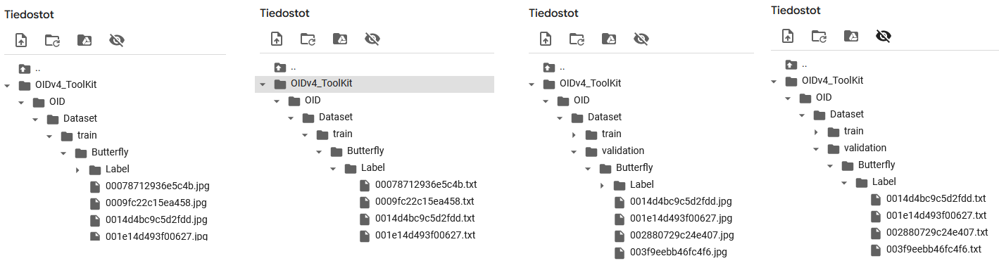

.txt files in folder Label contain the class and coordinates of the boxes

xmin, ymin, xmax, ymax



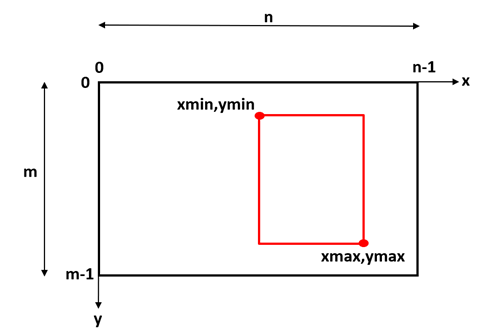

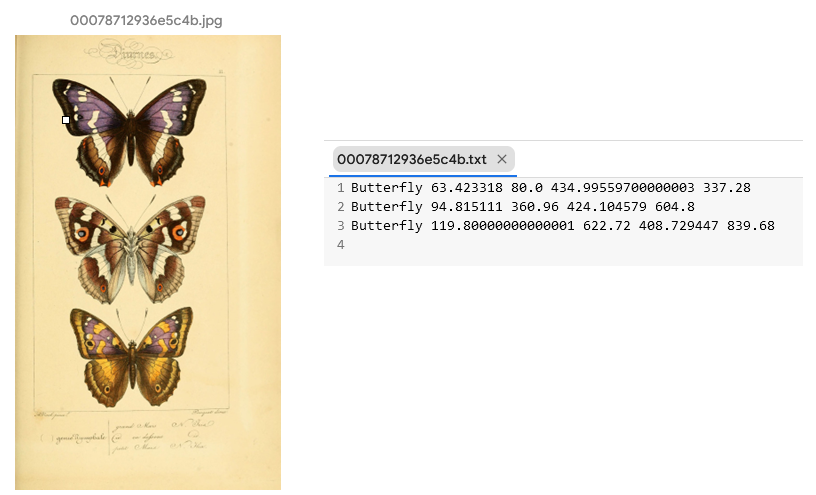

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

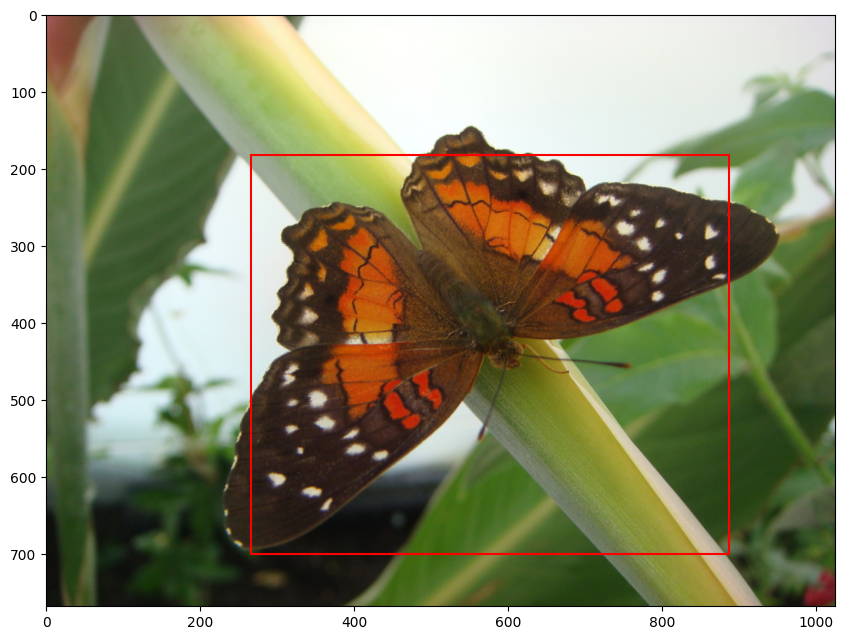

In [ ]:
#example image
filenames=os.listdir('/content/OIDv4_ToolKit/OID/Dataset/train/Butterfly/')
filenames.remove('Label')
filename=filenames[0]
piste=filename.find('.')
labelname=filename[:piste]+'.txt'
filepath='/content/OIDv4_ToolKit/OID/Dataset/train/Butterfly/'
kuva=plt.imread(filepath+filename)
m,n,_=kuva.shape
labelpath='/content/OIDv4_ToolKit/OID/Dataset/train/Butterfly/Label/'
label=np.loadtxt(labelpath+labelname,usecols=(1,2,3,4))

if len(label.shape)==1: #if only one box
  label=np.expand_dims(label,axis=0) #1D-array->2D-row vector

M=label.shape[0]

plt.figure(figsize=(n/100,m/100))
plt.imshow(kuva)
for r in range(M):
  xmin,ymin,xmax,ymax=label[r,:]
  plt.plot([xmin,xmax,xmax,xmin,xmin],[ymin,ymin,ymax,ymax,ymin],'r')
plt.show()

Coordinates to YOLO-form:

[Butterfly, xmin, ymin, xmax, ymax] $\to$ [0, xc/n, yc/m, w/n, h/m]


where 0 is the class of the object in the box, xc and yc coordinates of the center point, w and  h the width and heigth of the box

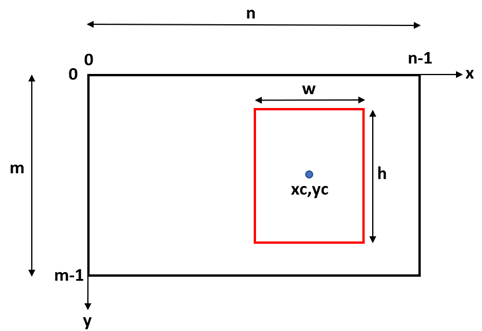

using convert_annotations.py from OIDv4-ToolKit

Update the names of the classes to classes.txt (double click to open in Colab)

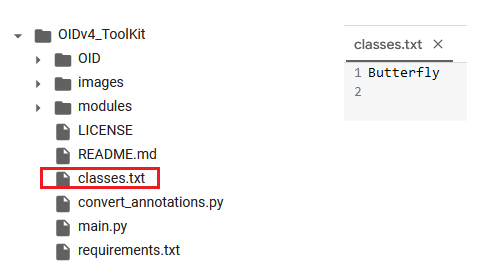

In [ ]:
!python convert_annotations.py

Currently in subdirectory: train
Converting annotations for class:  Butterfly
100% 12/12 [00:00<00:00, 71.11it/s]
Currently in subdirectory: validation
Converting annotations for class:  Butterfly
100% 6/6 [00:00<00:00, 45.61it/s]


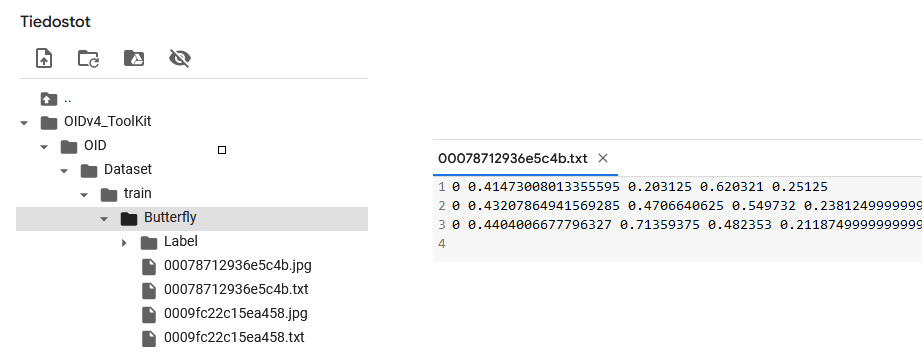

In [ ]:
#remove Label-folders
shutil.rmtree('/content/OIDv4_ToolKit/OID/Dataset/train/Butterfly/Label')
shutil.rmtree('/content/OIDv4_ToolKit/OID/Dataset/validation/Butterfly/Label')

In [ ]:
#create folders for training- and validation images
os.mkdir('/content/train')
os.mkdir('/content/train/images')
os.mkdir('/content/train/labels')
os.mkdir('/content/valid')
os.mkdir('/content/valid/images')
os.mkdir('/content/valid/labels')

In [ ]:
#move images and labels
dir='/content/OIDv4_ToolKit/OID/Dataset/train/Butterfly/'
filenames=os.listdir(dir)

for filename in filenames:
  filepath=dir + filename
  if filename.endswith(".txt"):
    shutil.move(filepath,'/content/train/labels/' + filename)
  else:
    shutil.move(filepath,'/content/train/images/' + filename)

dir='/content/OIDv4_ToolKit/OID/Dataset/validation/Butterfly/'
filenames=os.listdir(dir)

for filename in filenames:
  filepath=dir + filename
  if filename.endswith(".txt"):
    shutil.move(filepath,'/content/valid/labels/' + filename)
  else:
    shutil.move(filepath,'/content/valid/images/' + filename)

In [ ]:
#zip and take to Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
os.mkdir('/content/drive/MyDrive/YOLO11')
os.mkdir('/content/drive/MyDrive/YOLO11/train')
os.mkdir('/content/drive/MyDrive/YOLO11/valid')

In [ ]:
%cd /content/train/images
!zip -r /content/drive/MyDrive/YOLO11/train/images.zip ./
%cd /content/train/labels
!zip -r /content/drive/MyDrive/YOLO1/train/labels.zip ./

/content/train/images
  adding: 79a56ce6f538fda1.jpg (deflated 0%)
  adding: c81686279afda75c.jpg (deflated 0%)
  adding: fa77f6b2340bbaf4.jpg (deflated 0%)
  adding: 8cef5974816d799b.jpg (deflated 0%)
  adding: 3c80312f748519e0.jpg (deflated 0%)
  adding: 1a5a9773359afee7.jpg (deflated 0%)
  adding: 215d85ae5ab8a7d0.jpg (deflated 0%)
  adding: b08277bab840aee9.jpg (deflated 1%)
  adding: ed09d9a9e100165e.jpg (deflated 0%)
  adding: 9da52611921e82dc.jpg (deflated 0%)
  adding: ccb2a8b62a0b2780.jpg (deflated 0%)
  adding: 98beb9bd43e21278.jpg (deflated 1%)
/content/train/labels
zip I/O error: No such file or directory
zip error: Could not create output file (/content/drive/MyDrive/YOLO1/train/labels.zip)


In [ ]:
%cd /content/valid/images
!zip -r /content/drive/MyDrive/YOLO11/valid/images.zip ./
%cd /content/valid/labels
!zip -r /content/drive/MyDrive/YOLO11/valid/labels.zip ./

/content/valid/images
  adding: afc8cf7d9bf62aa2.jpg (deflated 0%)
  adding: 6c0954e004a2eb87.jpg (deflated 0%)
  adding: 0dee4626a70a76f8.jpg (deflated 0%)
  adding: ab2aea2fdf9dbe02.jpg (deflated 0%)
  adding: b67770d6c8164621.jpg (deflated 0%)
  adding: 34041c3c9b822090.jpg (deflated 0%)
/content/valid/labels
  adding: ab2aea2fdf9dbe02.txt (deflated 24%)
  adding: b67770d6c8164621.txt (deflated 54%)
  adding: 0dee4626a70a76f8.txt (deflated 10%)
  adding: 6c0954e004a2eb87.txt (deflated 38%)
  adding: afc8cf7d9bf62aa2.txt (deflated 32%)
  adding: 34041c3c9b822090.txt (deflated 15%)


Loading several classes:

In [ ]:
!git clone https://github.com/theAIGuysCode/OIDv4_ToolKit.git
%cd /content/OIDv4_ToolKit
!pip install -r requirements.txt
!python main.py downloader --classes Airplane Boat Car --type_csv train --limit 18 -y

Cloning into 'OIDv4_ToolKit'...
remote: Enumerating objects: 444, done.
remote: Total 444 (delta 0), reused 0 (delta 0), pack-reused 444 (from 1)
Receiving objects: 100% (444/444), 34.09 MiB | 29.94 MiB/s, done.
Resolving deltas: 100% (157/157), done.
/content/OIDv4_ToolKit
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 46.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.0/13.0 MB 58.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 548.2/548.2 kB 29.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 83.2/83.2 kB 6.1 MB/s eta 0:00:00
  Attempting uninstall: rsa
    Found existing installation: rsa 4.9
    Uninstalling rsa-4.9:
      Successfully uninstalled rsa-4.9
  Attempting uninstall: docutils
    Found existing installation: docutils 0.21.2
    Uninstalling docutils-0.21.2:
      Successfully uninstalled docutils-0.21.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This b

In [ ]:
#use first 6 for test/validation


import os
import shutil
classes=['Airplane','Boat','Car']
os.mkdir('/content/OIDv4_ToolKit/OID/Dataset/validation')
for name in classes:
  os.mkdir('/content/OIDv4_ToolKit/OID/Dataset/validation/'+name)
  os.mkdir('/content/OIDv4_ToolKit/OID/Dataset/validation/'+name+'/Label')

  filenames=os.listdir('/content/OIDv4_ToolKit/OID/Dataset/train/'+name)
  filenames.remove('Label')

  sour='/content/OIDv4_ToolKit/OID/Dataset/train/'+name+'/'
  dest='/content/OIDv4_ToolKit/OID/Dataset/validation/'+name+'/'

  #for i in range(300):
  for i in range(6):
    filename=filenames[i]
    shutil.move(sour+filename,dest+filename)
    piste=filename.find('.')
    labelname=filename[:piste]+'.txt'
    shutil.move(sour+'Label/'+labelname,dest+'Label/'+labelname)

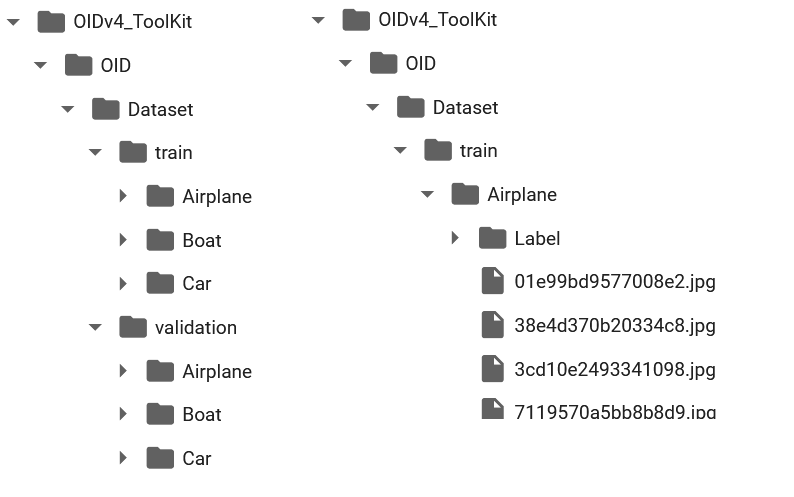

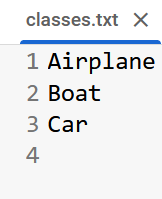

In [ ]:
!python convert_annotations.py

Currently in subdirectory: train
Converting annotations for class:  Boat
100% 12/12 [00:00<00:00, 50.99it/s]
Converting annotations for class:  Car
100% 12/12 [00:00<00:00, 29.47it/s]
Converting annotations for class:  Airplane
100% 12/12 [00:00<00:00, 64.13it/s]
Currently in subdirectory: validation
Converting annotations for class:  Boat
100% 6/6 [00:00<00:00, 45.30it/s]
Converting annotations for class:  Car
100% 6/6 [00:00<00:00, 79.95it/s]
Converting annotations for class:  Airplane
100% 6/6 [00:00<00:00, 86.18it/s]


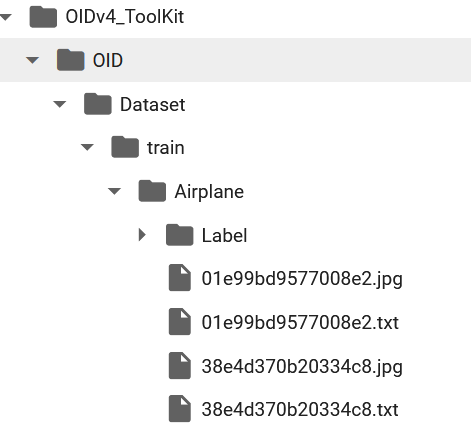

In [ ]:
#remove Label-folders
for name in ['Airplane','Boat','Car']:
  shutil.rmtree('/content/OIDv4_ToolKit/OID/Dataset/train/'+name+'/Label')
  shutil.rmtree('/content/OIDv4_ToolKit/OID/Dataset/validation/'+name+'/Label')


In [ ]:
#create folders for training- and validation images
os.mkdir('/content/train')
os.mkdir('/content/train/images')
os.mkdir('/content/train/labels')
os.mkdir('/content/valid')
os.mkdir('/content/valid/images')
os.mkdir('/content/valid/labels')

In [ ]:
#move images and labels
basedir='/content/OIDv4_ToolKit/OID/Dataset/train/'
basedir2='/content/OIDv4_ToolKit/OID/Dataset/validation/'
for name in ['Airplane','Boat','Car']:
  dir = basedir+name+'/'
  filenames=os.listdir(dir)
  for filename in filenames:
    filepath=dir + filename
    if filename.endswith(".txt"):
      shutil.move(filepath,'/content/train/labels/' + filename)
    else:
      shutil.move(filepath,'/content/train/images/' + filename)

  dir2 = basedir2+name+'/'
  filenames=os.listdir(dir2)
  for filename in filenames:
    filepath=dir2 + filename
    if filename.endswith(".txt"):
      shutil.move(filepath,'/content/valid/labels/' + filename)
    else:
      shutil.move(filepath,'/content/valid/images/' + filename)

In [ ]:
#zip and take to Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd /content/train/images
!zip -r /content/drive/MyDrive/YOLO11/train/images.zip ./
%cd /content/train/labels
!zip -r /content/drive/MyDrive/YOLO11/train/labels.zip ./

/content/train/images
  adding: 6b3452a4bb9d5190.jpg (deflated 0%)
  adding: 041da31554d506f7.jpg (deflated 0%)
  adding: a5eb194a67ca4a4e.jpg (deflated 0%)
  adding: 3a309516e54450ab.jpg (deflated 1%)
  adding: fd448a967a8e161d.jpg (deflated 0%)
  adding: a9a036daba47e828.jpg (deflated 0%)
  adding: 478e0460ba2da4d2.jpg (deflated 0%)
  adding: 44652ba938526872.jpg (deflated 1%)
  adding: ceb0e26345329ffb.jpg (deflated 0%)
  adding: c030ae35e391ef68.jpg (deflated 0%)
  adding: 4f9db20e1a18cedd.jpg (deflated 1%)
  adding: 0699bb88b2a35fdd.jpg (deflated 0%)
  adding: 89b58139fd13e6b6.jpg (deflated 0%)
  adding: bc89a2326544af3d.jpg (deflated 0%)
  adding: 7b45d6960afdd3e5.jpg (deflated 1%)
  adding: eacf52a86a663fcb.jpg (deflated 0%)
  adding: 0ab26032f30d320a.jpg (deflated 0%)
  adding: 124e77fe8568ea90.jpg (deflated 0%)
  adding: 1af164be493b2eda.jpg (deflated 0%)
  adding: 8eb900adeb39c427.jpg (deflated 1%)
  adding: 76dd358c473a47fb.jpg (deflated 0%)
  adding: df5ca0b58c65e823.jpg (d

##**Custom weights**

Train YOLO11 to locate butterflies using the dataset created above.


When training use  GPU (Runtime / Change runtime type)

In [ ]:
#create folders to Colab and unzip data from Drive
import os
os.makedirs('/content/custom_data')
os.makedirs('/content/custom_data/train')
os.makedirs('/content/custom_data/valid')
os.makedirs('/content/custom_data/train/images')
os.makedirs('/content/custom_data/valid/images')
os.makedirs('/content/custom_data/train/labels')
os.makedirs('/content/custom_data/valid/labels')

In [ ]:
#mount drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip '/content/drive/MyDrive/YOLOv8/train/images.zip' -d '/content/custom_data/train/images'

Archive:  /content/drive/MyDrive/YOLOv8/train/images.zip
  inflating: /content/custom_data/train/images/6b3452a4bb9d5190.jpg  
  inflating: /content/custom_data/train/images/041da31554d506f7.jpg  
  inflating: /content/custom_data/train/images/a5eb194a67ca4a4e.jpg  
  inflating: /content/custom_data/train/images/3a309516e54450ab.jpg  
  inflating: /content/custom_data/train/images/fd448a967a8e161d.jpg  
  inflating: /content/custom_data/train/images/a9a036daba47e828.jpg  
  inflating: /content/custom_data/train/images/478e0460ba2da4d2.jpg  
  inflating: /content/custom_data/train/images/44652ba938526872.jpg  
  inflating: /content/custom_data/train/images/ceb0e26345329ffb.jpg  
  inflating: /content/custom_data/train/images/c030ae35e391ef68.jpg  
  inflating: /content/custom_data/train/images/4f9db20e1a18cedd.jpg  
  inflating: /content/custom_data/train/images/0699bb88b2a35fdd.jpg  
  inflating: /content/custom_data/train/images/89b58139fd13e6b6.jpg  
  inflating: /content/custom_data

In [ ]:
!unzip '/content/drive/MyDrive/YOLOv8/train/labels.zip' -d '/content/custom_data/train/labels'

Archive:  /content/drive/MyDrive/YOLOv8/train/labels.zip
  inflating: /content/custom_data/train/labels/2cfe4af4c6bc10c9.txt  
  inflating: /content/custom_data/train/labels/238284293944fbd9.txt  
  inflating: /content/custom_data/train/labels/83858d39a81ee169.txt  
  inflating: /content/custom_data/train/labels/ebd9194f10b04bbd.txt  
  inflating: /content/custom_data/train/labels/03894f13493a0403.txt  
  inflating: /content/custom_data/train/labels/45782f53433dffed.txt  
  inflating: /content/custom_data/train/labels/4ba7804ef4e79b79.txt  
  inflating: /content/custom_data/train/labels/b647fe58d4b55e59.txt  
  inflating: /content/custom_data/train/labels/8d14ba7330cb225f.txt  
  inflating: /content/custom_data/train/labels/2b0929b0eb40735b.txt  
  inflating: /content/custom_data/train/labels/5da1129b5c3b8c15.txt  
  inflating: /content/custom_data/train/labels/617bdd6774d9582a.txt  
  inflating: /content/custom_data/train/labels/070527183bf53465.txt  
  inflating: /content/custom_data

In [ ]:
!unzip '/content/drive/MyDrive/YOLOv8/valid/images.zip' -d '/content/custom_data/valid/images'

Archive:  /content/drive/MyDrive/YOLOv8/valid/images.zip
  inflating: /content/custom_data/valid/images/d17c2b4c01e3b560.jpg  
  inflating: /content/custom_data/valid/images/0d5f85d0dce424ef.jpg  
  inflating: /content/custom_data/valid/images/03c36f458963141f.jpg  
  inflating: /content/custom_data/valid/images/7570283e795b2635.jpg  
  inflating: /content/custom_data/valid/images/bd3fffaef53f67a3.jpg  
  inflating: /content/custom_data/valid/images/ac9207bc65536c11.jpg  
  inflating: /content/custom_data/valid/images/43aa3c2ca339959c.jpg  
  inflating: /content/custom_data/valid/images/887c10fc647262d7.jpg  
  inflating: /content/custom_data/valid/images/4253fe3d9557f417.jpg  
  inflating: /content/custom_data/valid/images/63c2948427b41934.jpg  
  inflating: /content/custom_data/valid/images/b7651ec516b465b6.jpg  
  inflating: /content/custom_data/valid/images/c85e579a1ea96ca3.jpg  
  inflating: /content/custom_data/valid/images/22fb8b8c51dea965.jpg  
  inflating: /content/custom_data

In [ ]:
!unzip '/content/drive/MyDrive/YOLOv8/valid/labels.zip' -d '/content/custom_data/valid/labels'

Archive:  /content/drive/MyDrive/YOLOv8/valid/labels.zip
  inflating: /content/custom_data/valid/labels/ba162ea16971b823.txt  
  inflating: /content/custom_data/valid/labels/3e75afdbf188843e.txt  
  inflating: /content/custom_data/valid/labels/d9a672b2d459a80c.txt  
  inflating: /content/custom_data/valid/labels/e7cc4655ad246d91.txt  
  inflating: /content/custom_data/valid/labels/4ce1a95650d89d40.txt  
  inflating: /content/custom_data/valid/labels/d8f3548150df5a47.txt  
  inflating: /content/custom_data/valid/labels/3912da897de707a8.txt  
  inflating: /content/custom_data/valid/labels/1bcf0d150989fcd0.txt  
  inflating: /content/custom_data/valid/labels/fa77f6b2340bbaf4.txt  
  inflating: /content/custom_data/valid/labels/f30bcaf2fb3b504d.txt  
  inflating: /content/custom_data/valid/labels/b1445d6bfe17d44a.txt  
  inflating: /content/custom_data/valid/labels/aba6b67464abeb45.txt  
  inflating: /content/custom_data/valid/labels/daf7144246ba04e7.txt  
  inflating: /content/custom_data

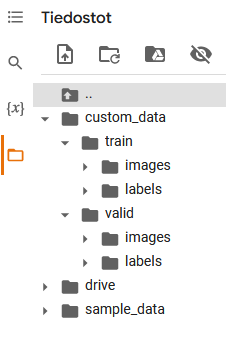

Create file
 custom_data.yaml containing paths and class names and load it to Colab.

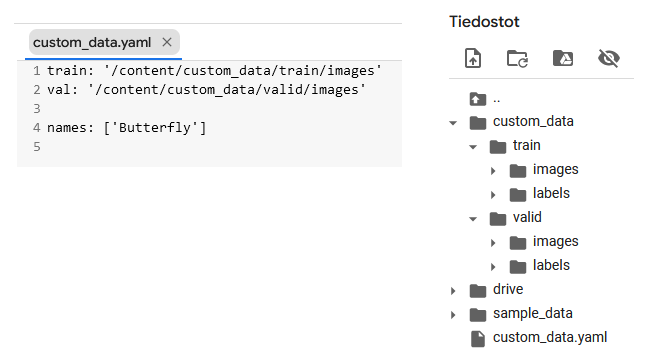

In [ ]:
import shutil
shutil.copy('/content/drive/MyDrive/YOLOv8/custom_data.yaml','/content')

'/content/custom_data.yaml'

In [ ]:
%cd '/content'

/content


In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 896.3/896.3 kB 25.7 MB/s eta 0:00:00


In [ ]:
from ultralytics import YOLO
model=YOLO('yolo11n.pt') #use pretrained weights as initializations

100%|██████████| 6.23M/6.23M [00:00<00:00, 24.9MB/s]


In [ ]:
#train using custom data
model.train(data='/content/custom_data.yaml',epochs=30,imgsz=640,cache=True)

#if you want to continue more epochs:
#model=YOLO('/content/runs/detect/train/weights/last.pt')
#model.train(data='/content/custom_data.yaml',epochs=30,imgsz=640,cache=True)

Ultralytics YOLOv8.0.110 🚀 Python-3.10.11 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
yolo/engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/custom_data.yaml, epochs=30, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=True, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=0, resume=False, amp=True, fraction=1.0, profile=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, keras=False, optimize=False, int8=False, dynamic=F

In [ ]:
#copy best weigts to Drive
import shutil
sour='/content/runs/detect/train/weights/best.pt'
dest='/content/drive/MyDrive/YOLOv8/butterfly.pt'
shutil.copy(sour,dest)

'/content/drive/MyDrive/YOLOv8/Butterfly.pt'

In [ ]:
#load best weights
#!pip install ultralytics
#from ultralytics import YOLO
model=YOLO('/content/drive/MyDrive/YOLOv8/butterfly.pt')

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
#predictions for test image (this doesn't need GPU)
predictions=model.predict('/content/butterfly.jpg',save=True) #,conf=0.5) -> shows only predictions with confidence>0.5
laatikot=predictions[0].boxes.data.cpu().numpy() #t .cpu(), if GPU is in use
print(laatikot) #[xmin,ymin,xmax,ymax,confidence,luokka]



image 1/1 /content/butterfly.jpg: 448x640 1 Butterfly, 590.1ms
Speed: 15.6ms preprocess, 590.1ms inference, 2.0ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict
[[     319.08      97.904      690.23       565.6     0.92578           0]]


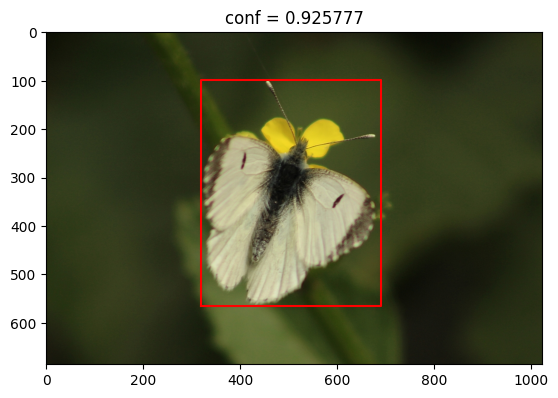

In [ ]:
kuva=plt.imread('/content/butterfly.jpg')
xmin,ymin,xmax,ymax,conf,cls=laatikot[0,:]
plt.imshow(kuva)
plt.plot([xmin,xmax,xmax,xmin,xmin],[ymax,ymax,ymin,ymin,ymax],'r')
plt.title('conf = '+str(conf))
plt.show()

In [ ]:
#prediction for test image
dir = '/content/custom_data/valid/'
kuvanimet=os.listdir(dir+'images')
N=len(kuvanimet)
k=np.random.randint(N)
kuvanimi=kuvanimet[k]
predictions=model.predict(dir+'images/'+kuvanimi,save=True) #,conf=0.5) -> shows only predictions with confidence >0.5
laatikot=predictions[0].boxes.data.cpu().numpy() # .cpu(), if you use GPU
print(laatikot) #[xmin,ymin,xmax,ymax,confidence,luokka]



image 1/1 /content/custom_data/valid/images/4efa4fbec48ac59a.jpg: 640x416 1 Butterfly, 169.9ms
Speed: 3.0ms preprocess, 169.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 416)
Results saved to runs/detect/predict
[[     17.546      30.065      590.94      827.59     0.79967           0]]


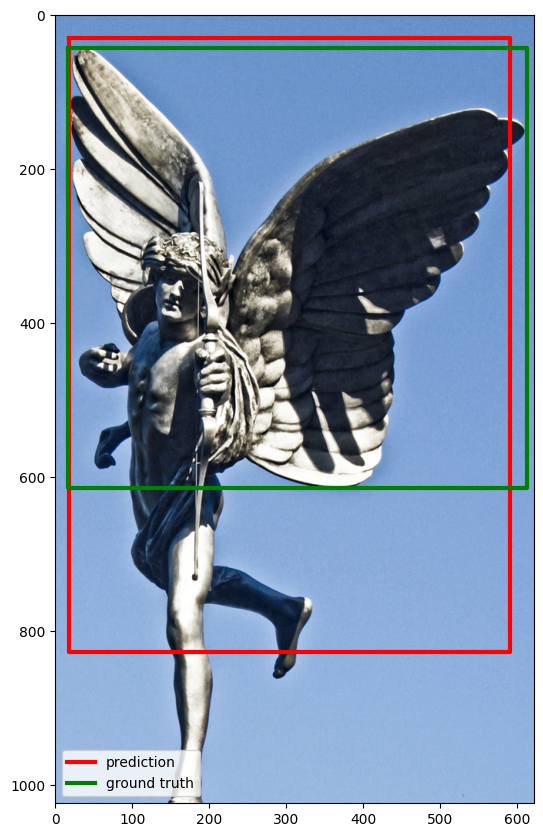

In [ ]:
#predicted and ground truth boxes
mp=laatikot.shape[0] #number of predicted boxes
ind=kuvanimi.find('.')
labelnimi=kuvanimi[:ind]+'.txt'
labels=np.loadtxt(dir+'/labels/'+labelnimi)
#if only one ground truth box, reshape labels 1D-array -> 2D-array (row vector)
if len(labels.shape)==1:
  labels=np.expand_dims(labels,axis=0)

ml=labels.shape[0] #number of ground truth boxes

kuva=plt.imread(dir+'images/'+kuvanimi)
m,n=kuva.shape[:2]

plt.figure(figsize=(n/100,m/100))
plt.imshow(kuva)

#predicted boxes
for r in range(mp):
  Xmin,Ymin,Xmax,Ymax,Conf,Luokka=laatikot[r,:] #Conf(idence) = probability that box contains an object of class Luokka
  if r==0:
    plt.plot([Xmin,Xmin,Xmax,Xmax,Xmin],[Ymin,Ymax,Ymax,Ymin,Ymin],'r',lw=3,label='prediction')
  else:
    plt.plot([Xmin,Xmin,Xmax,Xmax,Xmin],[Ymin,Ymax,Ymax,Ymin,Ymin],'r',lw=3)


#ground truth boxes
for r in range(ml):
  luokka,xc,yc,w,h=labels[r,:]
  xc*=n
  yc*=m
  w*=n
  h*=m
  xmin=xc-w/2
  ymin=yc-h/2
  xmax=xc+w/2
  ymax=yc+h/2
  if r==0:
    plt.plot([xmin,xmin,xmax,xmax,xmin],[ymin,ymax,ymax,ymin,ymin],'g',lw=3,label='ground truth')
  else:
    plt.plot([xmin,xmin,xmax,xmax,xmin],[ymin,ymax,ymax,ymin,ymin],'g',lw=3)
plt.legend()
plt.show()


Measure for the goodness of predicted box:



$$
\textrm{IoU = Intersection over Union} = \frac{\textrm{area of intersection }}{\text{are of union}}$$


$$
\begin{array}{l}
\\
\end{array}
$$

If predicted and  ground truth boxes are near each other, then $\textrm{IoU}\approx 1$


If predicted and  ground truth boxes are far away, then $\textrm{IoU}\approx 0$





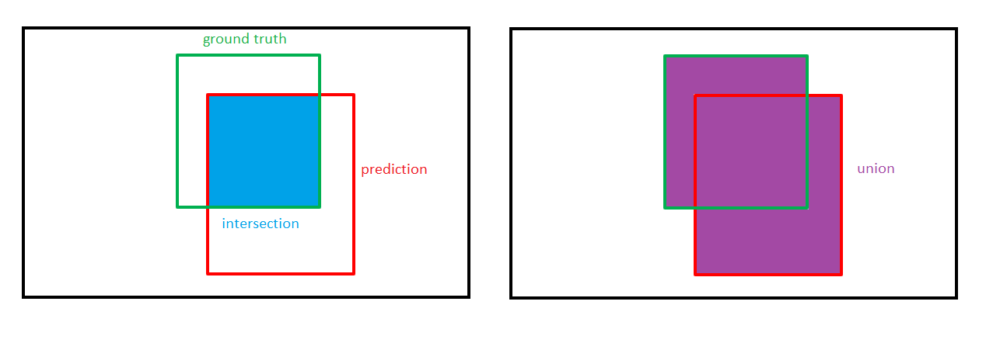

IoU = 0.6968416178555373


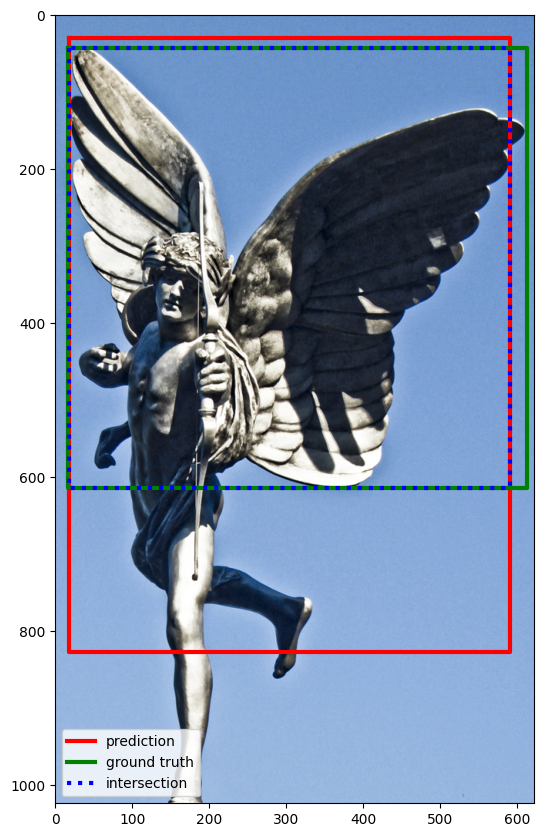

In [ ]:
#if only one predicted and ground truth box
#calculate IoU
#corners of intersection
Ixmin=max([Xmin,xmin])
Iymin=max([Ymin,ymin])
Ixmax=min([Xmax,xmax])
Iymax=min([Ymax,ymax])
#area of intersection
A_of_I=(Ixmax-Ixmin)*(Iymax-Iymin)
#area of union
A_of_U=(Xmax-Xmin)*(Ymax-Ymin)+(xmax-xmin)*(ymax-ymin)-A_of_I

IoU=A_of_I/A_of_U
print('IoU = '+str(IoU))
plt.figure(figsize=(n/100,m/100))
plt.imshow(kuva)
plt.plot([Xmin,Xmin,Xmax,Xmax,Xmin],[Ymin,Ymax,Ymax,Ymin,Ymin],'r',lw=3,label='prediction')
plt.plot([xmin,xmin,xmax,xmax,xmin],[ymin,ymax,ymax,ymin,ymin],'g',lw=3,label='ground truth')
plt.plot([Ixmin,Ixmin,Ixmax,Ixmax,Ixmin],[Iymin,Iymax,Iymax,Iymin,Iymin],'b:',lw=3,label='intersection')
plt.legend()
plt.show()



If $\textrm{IoU}\ge $ IoU-threshold, then prediction is true positive

If $\textrm{IoU}<$ IoU-threshold, then prediction is false positive

$$
\begin{array}{l}
\\
\end{array}
$$


P = Precision = $\displaystyle{\frac{\textrm{true positives}}{\textrm{all predictions}}}$ = what fraction of predictions were correct (true positive)

$$
\begin{array}{l}
\\
\end{array}
$$

R = Recall = $\displaystyle{\frac{\textrm{true positives}}{\textrm{all ground truths}}}$ = what fraction of  ground truth boxes were predicted correctly

$$
\begin{array}{l}
\\
\end{array}
$$












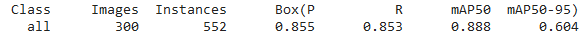

P = 0.855 and R = 0.853 for validation images, when IoU-threshold = 0.5


AP = average precision is calculated using the confidences (for each object class)

mAP = mean of APs for different object classes


mAP50 = mAP @ 0.5 = mean average precision, when IoU-threshold = 0.5

mAP50-95 = mAP @ 0.5:0.05:0.95 = mean of mAPs, when  IoU-threshold = 0.5,0.55,...,0.95

Best weights: smallest fitness  = 0.1$*$mAP50 + 0.9$*$mAP50-95  for validation images


https://docs.ultralytics.com/guides/yolo-performance-metrics/


https://github.com/rafaelpadilla/Object-Detection-Metrics


https://jonathan-hui.medium.com/map-mean-average-precision-for-object-detection-45c121a31173



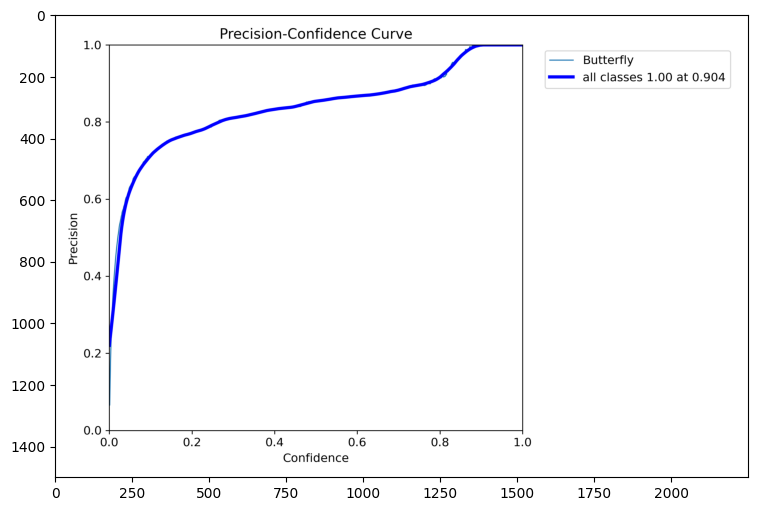

In [ ]:
#precision-confidence curve (IoU-threshold = 0.5)
P_curve=plt.imread('/content/runs/detect/train/P_curve.png')
plt.figure(figsize=(10,6))
plt.imshow(P_curve)
plt.show()

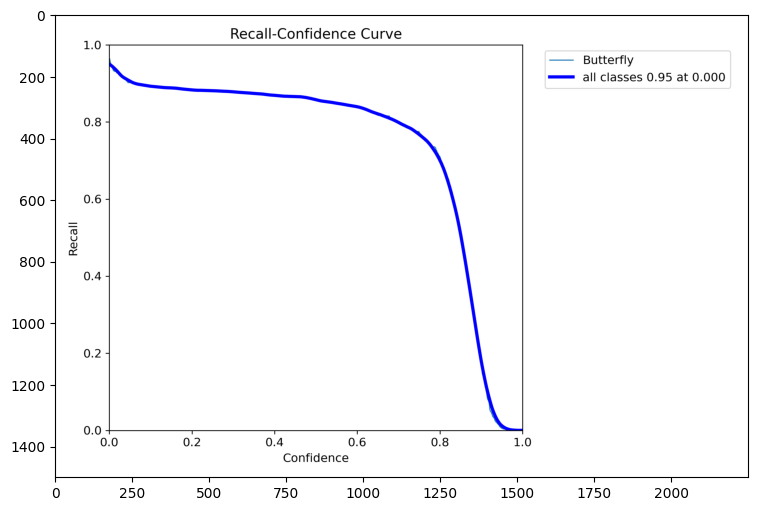

In [ ]:
#recall-confidence curve (IoU-threshold = 0.5)
R_curve=plt.imread('/content/runs/detect/train/R_curve.png')
plt.figure(figsize=(10,6))
plt.imshow(R_curve)
plt.show()

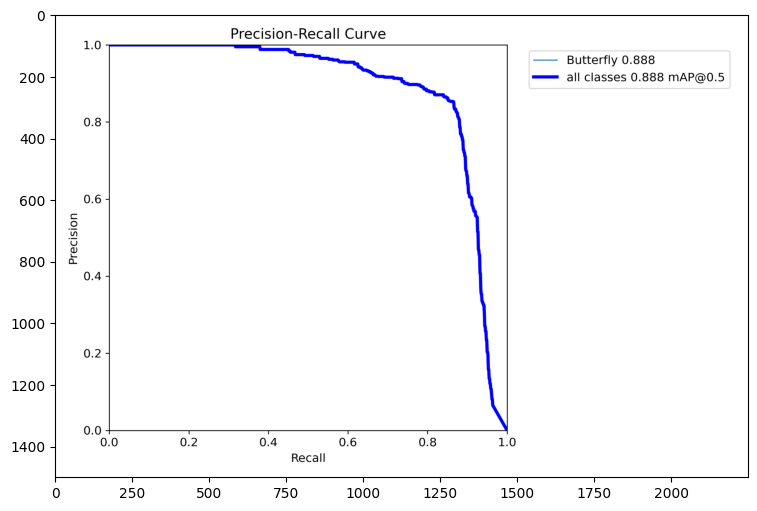

In [ ]:
#precision-recall cuve (AP is the area under the curve)
PR_curve=plt.imread('/content/runs/detect/train/PR_curve.png')
plt.figure(figsize=(10,6))
plt.imshow(PR_curve)
plt.show()

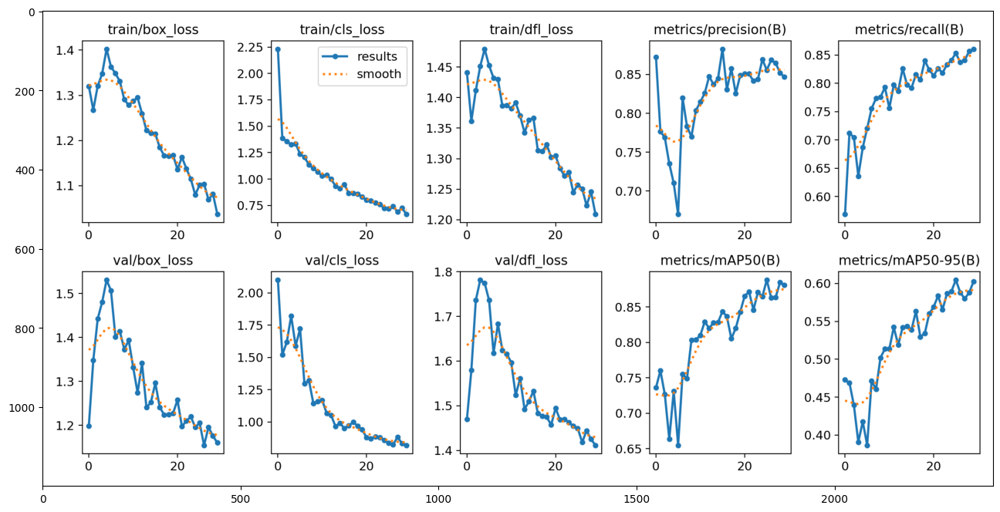

In [ ]:
#parts of the cost function (box_loss, cls_loss, dfl_loss)
#precision, recall and mAPs
#after each epoch
results=plt.imread('/content/runs/detect/train/results.png')
plt.figure(figsize=(16,8))
plt.imshow(results)
plt.show()